<a href="https://colab.research.google.com/github/Shashwot90/objectdetection/blob/main/portfolio_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# **2 Tasks - Image Classification. [40]**

In [ ]:
dataset_dir = "/kaggle/input/5-flower-types-classification-dataset/flower_images"

# 2.1 Task1: Data Understanding [5]

In this task, we expect you to collect the data, understand the data about and perform following activities:

In [ ]:
import os
import matplotlib.pyplot as plt
from keras.preprocessing.image import load_img
from PIL import Image

**1. Data Analysis:** In this section you must try to answer following questions.

* How many total images are in the dataset?

In [ ]:
total_images = 0


for class_name in os.listdir(dataset_dir):
    class_path = os.path.join(dataset_dir, class_name)
    if os.path.isdir(class_path):

        num_images = len(os.listdir(class_path))
        print(f"Class: {class_name}, Number of Images: {num_images}")

        total_images += num_images


print("Total number of images in the dataset:", total_images)

Class: Orchid, Number of Images: 1000
Class: Sunflower, Number of Images: 1000
Class: Tulip, Number of Images: 1000
Class: Lotus, Number of Images: 1000
Class: Lilly, Number of Images: 1000
Total number of images in the dataset: 5000


Class: Orchid, Number of Images: 1000
Class: Sunflower, Number of Images: 1000
Class: Tulip, Number of Images: 1000
Class: Lotus, Number of Images: 1000
Class: Lilly, Number of Images: 1000
Total number of images in the dataset: 5000


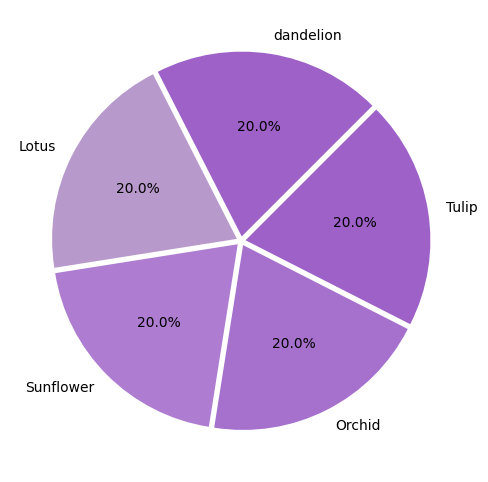

In [ ]:
import os
import matplotlib.pyplot as plt

total_images = 0
class_counts = {'Lilly': 0, 'Lotus': 0, 'Sunflower': 0, 'Orchid': 0, 'Tulip': 0}

for class_name in os.listdir(dataset_dir):
    class_path = os.path.join(dataset_dir, class_name)
    if os.path.isdir(class_path):
        num_images = len(os.listdir(class_path))
        print(f"Class: {class_name}, Number of Images: {num_images}")
        total_images += num_images
        class_counts[class_name] = num_images

print("Total number of images in the dataset:", total_images)


if all(value == 0 for value in class_counts.values()):
    print("No data available for visualization.")
else:
    plt.figure(figsize=(14,6))
    colors = ["#9D61C8", "#B799CB", "#ae7cd1", "#a670cd"]
    plt.pie([class_counts['Lilly'], class_counts['Lotus'], class_counts['Sunflower'], class_counts['Orchid'], class_counts['Tulip']],
            labels=['dandelion','Lotus', 'Sunflower', 'Orchid', 'Tulip'],
            colors=colors, autopct='%.1f%%', explode=(0.025,0.025,0.025,0.025,0.025),
            startangle=45)
    plt.show()


* How balanced is your dataset?i.e. image per class or label

In [ ]:
class_counts = {}


for class_name in os.listdir(dataset_dir):
    class_path = os.path.join(dataset_dir, class_name)
    if os.path.isdir(class_path):

        num_images = len(os.listdir(class_path))
        class_counts[class_name] = num_images

        total_images += num_images


print("Class\t\tNumber of Images\tPercentage")
print("----------------------------------------------------")
for class_name, count in class_counts.items():
    percentage = (count / total_images) * 100
    print(f"{class_name}\t\t{count}\t\t{percentage:.2f}%")

Class		Number of Images	Percentage
----------------------------------------------------
Orchid		1000		10.00%
Sunflower		1000		10.00%
Tulip		1000		10.00%
Lotus		1000		10.00%
Lilly		1000		10.00%


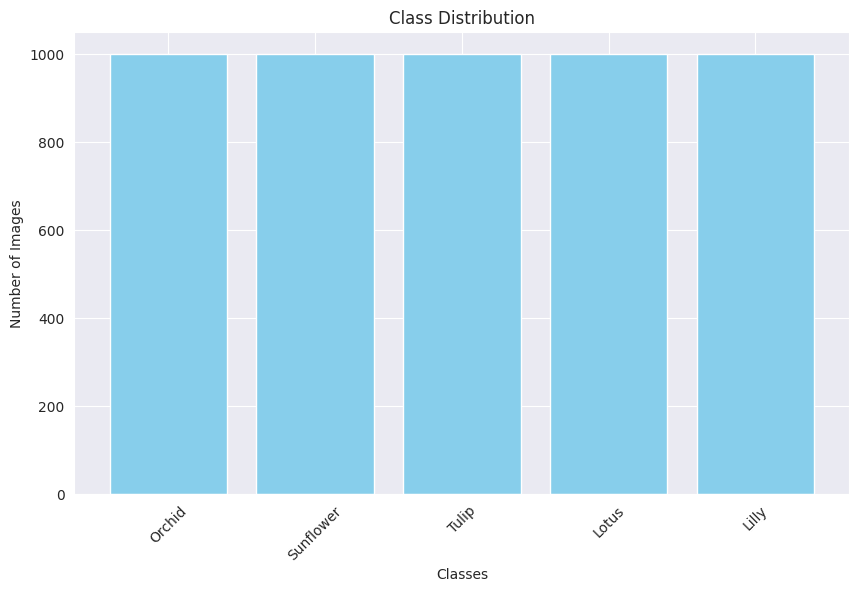

In [ ]:

plt.figure(figsize=(10, 6))
plt.bar(class_counts.keys(), class_counts.values(), color='skyblue')
plt.xlabel('Classes')
plt.ylabel('Number of Images')
plt.title('Class Distribution')
plt.xticks(rotation=45)
plt.show()

* How is your data distributed among train, valid and test set? If not How will you split the dataset among aforementioned folder.

In [ ]:
import os
import shutil
import random

dataset_dir = "/kaggle/input/5-flower-types-classification-dataset/flower_images"
split_dir = "/kaggle/working/5-flower-types-classification-dataset/flower_images/flowers_split1"
os.makedirs(split_dir, exist_ok=True)

train_ratio = 0.7
val_ratio = 0.15
test_ratio = 0.15

train_dir = os.path.join(split_dir, "train")
val_dir = os.path.join(split_dir, "val")
test_dir = os.path.join(split_dir, "test")
os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

for class_name in os.listdir(dataset_dir):
    class_dir = os.path.join(dataset_dir, class_name)
    if os.path.isdir(class_dir):

        image_files = [f for f in os.listdir(class_dir) if f.endswith(".jpg") or f.endswith(".png")]
        random.shuffle(image_files)

        num_images = len(image_files)
        num_train = int(num_images * train_ratio)
        num_val = int(num_images * val_ratio)
        num_test = num_images - num_train - num_val

        train_images = image_files[:num_train]
        val_images = image_files[num_train:num_train + num_val]
        test_images = image_files[num_train + num_val:]

        for img in train_images:
            src = os.path.join(class_dir, img)
            dst = os.path.join(train_dir, class_name, img)  # Adjusted destination directory
            os.makedirs(os.path.dirname(dst), exist_ok=True)
            shutil.copy(src, dst)

        for img in val_images:
            src = os.path.join(class_dir, img)
            dst = os.path.join(val_dir, class_name, img)  # Adjusted destination directory
            os.makedirs(os.path.dirname(dst), exist_ok=True)
            shutil.copy(src, dst)

        for img in test_images:
            src = os.path.join(class_dir, img)
            dst = os.path.join(test_dir, class_name, img)  # Adjusted destination directory
            os.makedirs(os.path.dirname(dst), exist_ok=True)
            shutil.copy(src, dst)

print("Dataset split into train, validation, and test sets successfully.")


Dataset split into train, validation, and test sets successfully.


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


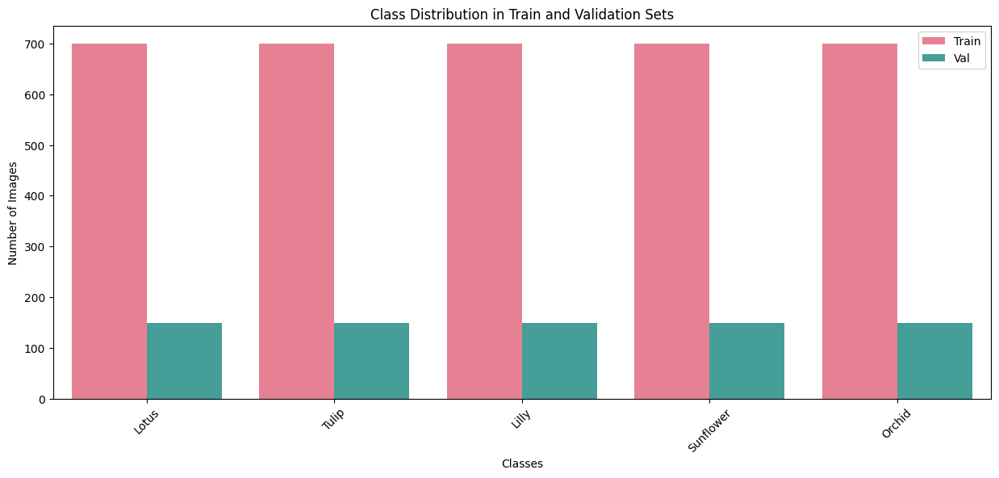

In [ ]:
import seaborn as sns


train_class_counts = {class_name: len(os.listdir(os.path.join(train_dir, class_name))) for class_name in os.listdir(train_dir)}
val_class_counts = {class_name: len(os.listdir(os.path.join(val_dir, class_name))) for class_name in os.listdir(val_dir)}


plt.figure(figsize=(15, 6))
sns.barplot(x=list(train_class_counts.keys()) + list(val_class_counts.keys()),
            y=list(train_class_counts.values()) + list(val_class_counts.values()),
            hue=['Train'] * len(train_class_counts) + ['Val'] * len(val_class_counts),
            palette=sns.color_palette("husl", 2))
plt.xlabel('Classes')
plt.ylabel('Number of Images')
plt.title('Class Distribution in Train and Validation Sets')
plt.xticks(rotation=45)
plt.legend()
plt.show()


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


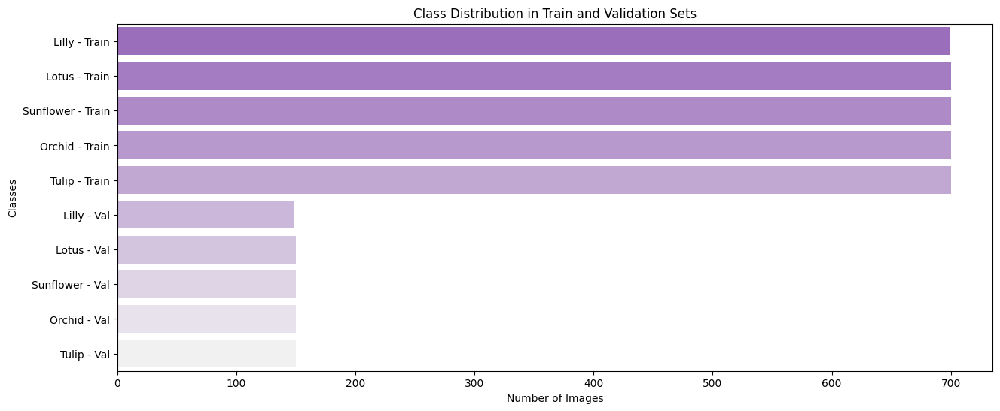

In [ ]:
import os
import matplotlib.pyplot as plt
import seaborn as sns


train_dir = "/kaggle/working/5-flower-types-classification-dataset/flower_images/flowers_split1/train"
val_dir = "/kaggle/working/5-flower-types-classification-dataset/flower_images/flowers_split1/val"


classes = ['Lilly', 'Lotus', 'Sunflower', 'Orchid', 'Tulip']


train_counts = {class_name: len(os.listdir(os.path.join(train_dir, class_name))) for class_name in classes}
val_counts = {class_name: len(os.listdir(os.path.join(val_dir, class_name))) for class_name in classes}


train_counts_values = [train_counts[class_name] for class_name in classes]
val_counts_values = [val_counts[class_name] for class_name in classes]


train_labels = [f'{cls} - Train' for cls in classes]
val_labels = [f'{cls} - Val' for cls in classes]


counts = train_counts_values + val_counts_values
labels = train_labels + val_labels


palette = sns.light_palette("#9D61C8", reverse=True, n_colors=len(labels))


plt.figure(figsize=(15, 6))
sns.barplot(x=counts, y=labels, palette=palette)
plt.xlabel('Number of Images')
plt.ylabel('Classes')
plt.title('Class Distribution in Train and Validation Sets')
plt.show()


**2. Data Visualization:** Following must be done in this step:

* Visualize at least one image per class.

In [ ]:
import os
import shutil
import random

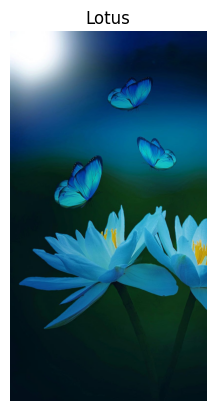

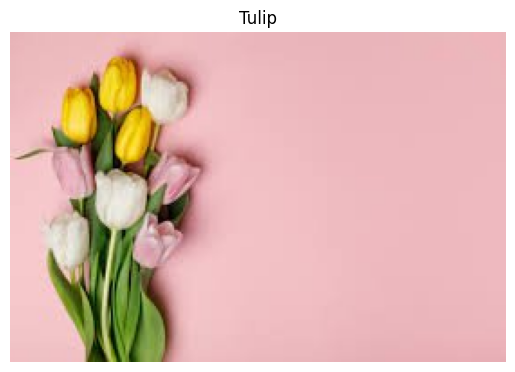

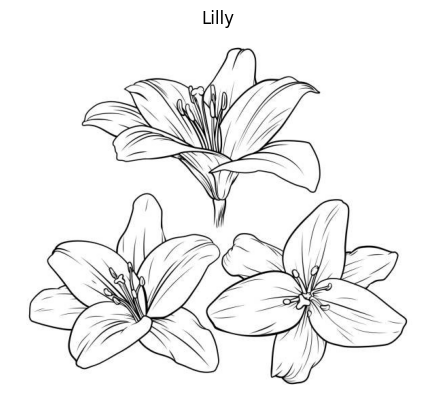

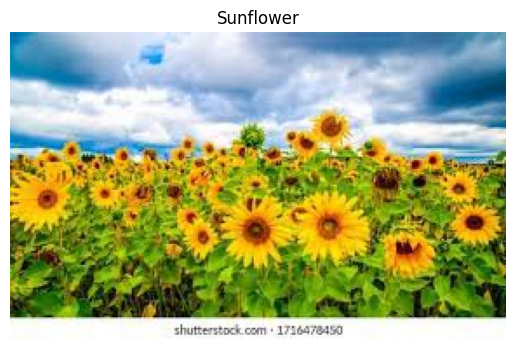

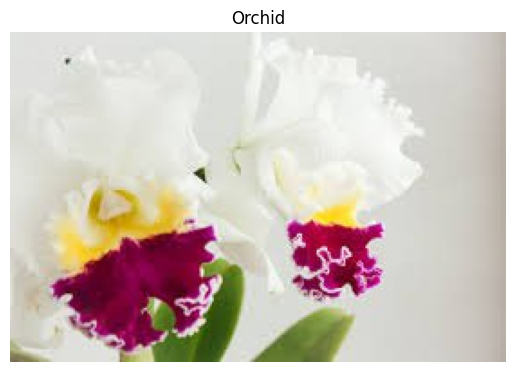

In [ ]:


train_dir = '/kaggle/working/5-flower-types-classification-dataset/flower_images/flowers_split1/train'


classes = os.listdir(train_dir)


num_cols = 3


images_displayed = {}


for class_name in classes:

    class_dir = os.path.join(train_dir, class_name)
    image_files = [f for f in os.listdir(class_dir) if f.endswith(".jpg") or f.endswith(".png")]


    if len(image_files) > 0:

        image_path = os.path.join(class_dir, image_files[0])
        img = load_img(image_path)


        plt.imshow(img)
        plt.title(class_name)
        plt.axis('off')
        plt.show()


* Investigate Visually whether there are any corrupted images or not.

In [ ]:



def is_corrupted_image(image_path):
    try:

        img = Image.open(image_path)
        img.verify()
        return False
    except (IOError, SyntaxError):
        return True


corrupted_images = []
for class_name in os.listdir(train_dir):
    class_dir = os.path.join(train_dir, class_name)
    if os.path.isdir(class_dir):
        for img_name in os.listdir(class_dir):
            img_path = os.path.join(class_dir, img_name)
            if is_corrupted_image(img_path):
                corrupted_images.append(img_path)


if corrupted_images:
    print("Corrupted images found:")
    for img_path in corrupted_images:
        print(img_path)
        img = Image.open(img_path)
        plt.imshow(img)
        plt.axis('off')
        plt.show()
else:
    print("No corrupted images found.")


No corrupted images found.


**3. Data Pre - processing:** Following must be done in this step:

* What kind of Data Generator you used for the task?

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator


train_dir = "/kaggle/working/5-flower-types-classification-dataset/flower_images/flowers_split1/train"
val_dir = "/kaggle/working/5-flower-types-classification-dataset/flower_images/flowers_split1/val"
test_dir = "/kaggle/working/5-flower-types-classification-dataset/flower_images/flowers_split1/test"


train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)


train_gen = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)


val_gen = ImageDataGenerator(rescale=1./255).flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)


test_gen = ImageDataGenerator(rescale=1./255).flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    shuffle = False,
    class_mode='categorical'
)


Found 3499 images belonging to 5 classes.
Found 749 images belonging to 5 classes.
Found 751 images belonging to 5 classes.


* Did you use any augmentations or not if yes visualize one image per augmentations style you have used.?

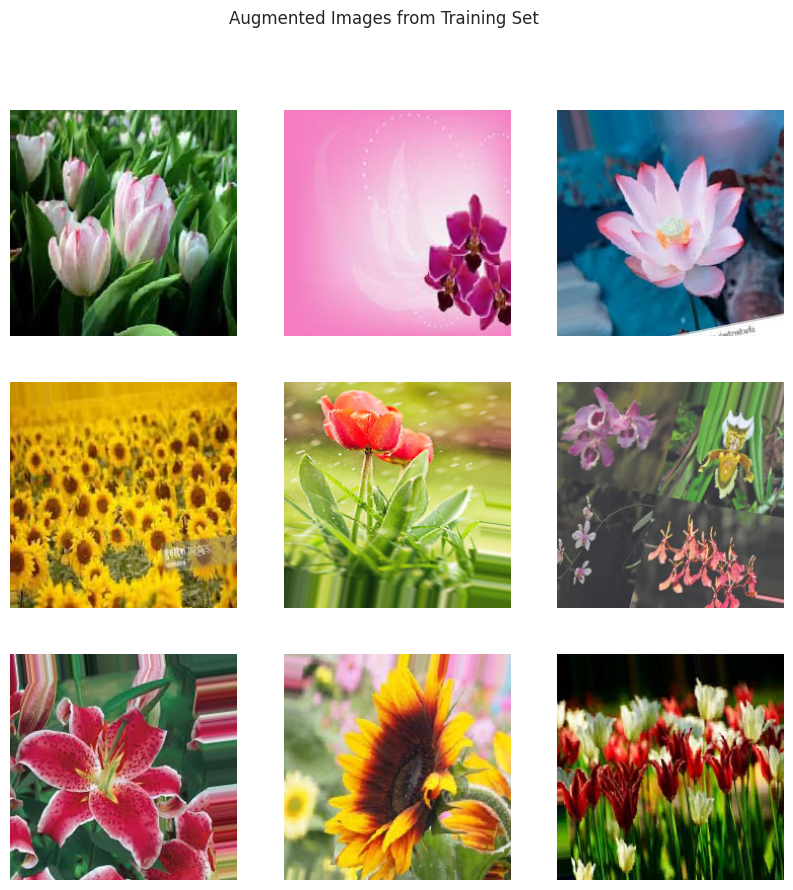

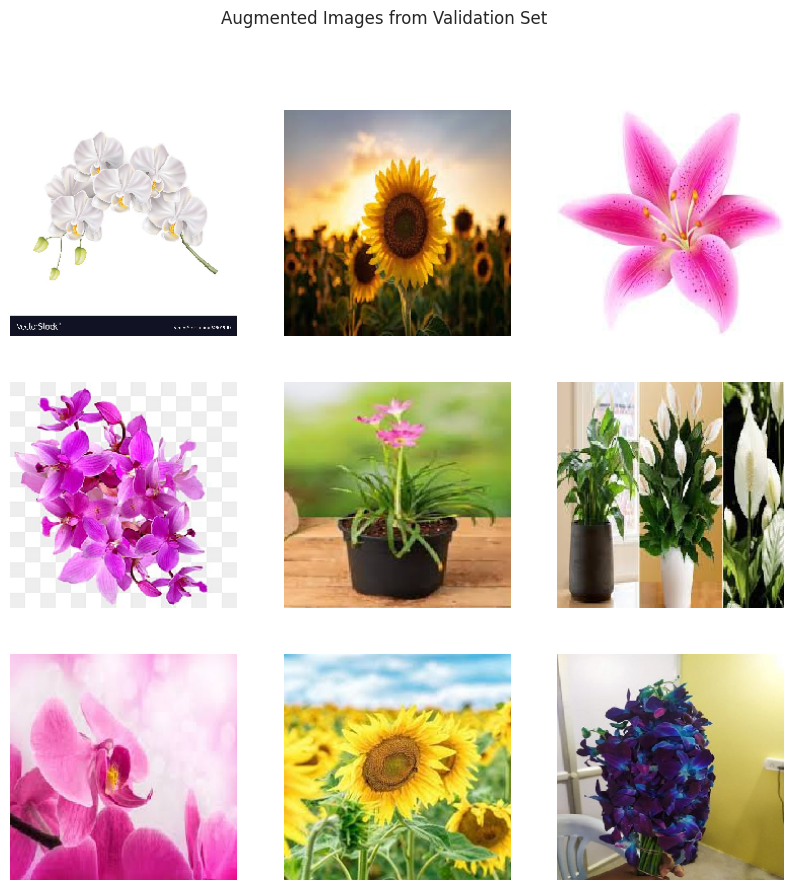

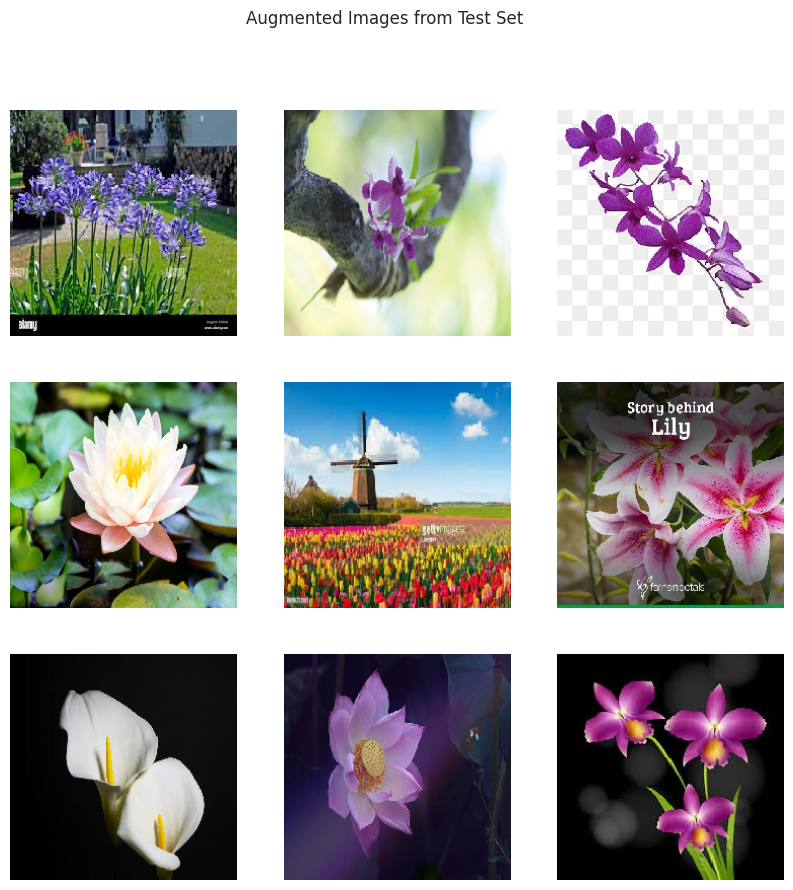

In [ ]:
import numpy as np
import matplotlib.pyplot as plt


train_batch, _ = next(train_gen)


val_batch, _ = next(val_gen)


test_batch, _ = next(test_gen)


plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(train_batch[i])
    plt.axis('off')
plt.suptitle('Augmented Images from Training Set')
plt.show()


plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(val_batch[i])
    plt.axis('off')
plt.suptitle('Augmented Images from Validation Set')
plt.show()


plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(test_batch[i])
    plt.axis('off')
plt.suptitle('Augmented Images from Test Set')
plt.show()


Found 3499 images belonging to 5 classes.


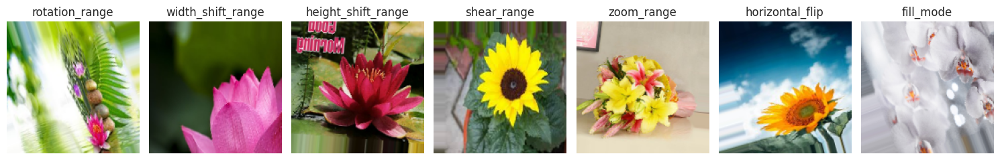

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator


train_dir = "/kaggle/working/5-flower-types-classification-dataset/flower_images/flowers_split1/train"


augmentation_params = {
    "rotation_range": 20,
    "width_shift_range": 0.1,
    "height_shift_range": 0.1,
    "shear_range": 0.1,
    "zoom_range": 0.1,
    "horizontal_flip": True,
    "fill_mode": 'nearest'
}


datagen = ImageDataGenerator(**augmentation_params)


augmented_images = []


batch = datagen.flow_from_directory(
    train_dir,
    target_size=(150, 150),
    batch_size=1,
    class_mode=None
)


for i in range(len(augmentation_params)):
    augmented_img = next(batch)
    augmented_images.append(augmented_img[0])



titles = list(augmentation_params.keys())
fig, axes = plt.subplots(1, len(augmentation_params), figsize=(15, 3))

for i, augmented_img in enumerate(augmented_images):
    axes[i].imshow(augmented_img.astype(np.uint8))
    axes[i].set_title(titles[i])
    axes[i].axis('off')

plt.tight_layout()
plt.show()


# **2.2 Task2: Building Fully Connected Neural Network[8].**

Cautions!! This section has multiple sub - tasks.

In this section you are expected to complete following tasks:

**1. Model Building:[2]**

Based on the size of your input image, design and build FCNN. You can have as many layers you think is required for your task. You should be able to explain your model summary.

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, BatchNormalization


input_shape = (224, 224, 3)


model1 = Sequential()


model1.add(Flatten(input_shape=input_shape))


model1.add(Dense(1024, activation='relu'))
model1.add(BatchNormalization())


model1.add(Dense(512, activation='relu'))
model1.add(BatchNormalization())

model1.add(Dense(512, activation='relu'))
model1.add(BatchNormalization())


model1.add(Dense(512, activation='relu'))
model1.add(BatchNormalization())
model1.add(Dropout(0.2))

model1.add(Dense(512, activation='relu'))
model1.add(BatchNormalization())
model1.add(Dropout(0.2))

model1.add(Dense(128, activation='relu'))
model1.add(BatchNormalization())
model1.add(Dropout(0.2))

model1.add(Dense(64, activation='relu'))
model1.add(BatchNormalization())
model1.add(Dropout(0.2))


num_classes = 5
model1.add(Dense(num_classes, activation='softmax'))


model1.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])


model1.summary()


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_4 (Flatten)             │ (None, 150528)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 1024)           │   154,141,696 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_11          │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_12          │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_13          │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_14          │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_15          │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_16          │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_17          │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 5)              │           325 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 155,541,765 (593.34 MB)

 Trainable params: 155,535,237 (593.32 MB)

 Non-trainable params: 6,528 (25.50 KB)

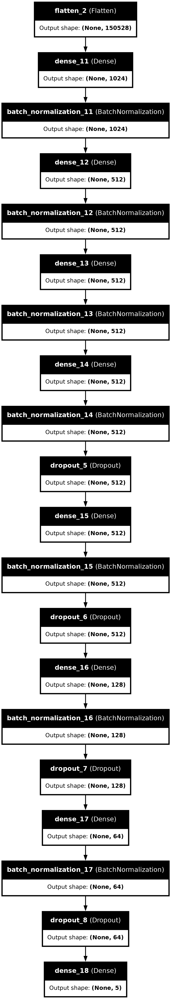

In [ ]:

tf.keras.utils.plot_model(model1, to_file='model.png', show_shapes=True, show_layer_names=True)

**2. Train the Model:[2]**

* Once the model is built, Train your model for as many epochs you think is necessary. cautions: Think about the computing complexity, we suggest you to utilize the GPU of the Google Colab.!!!

* You can use any optimizer and loss function of your choice.

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping


epochs = 100 #100


early_stopping = EarlyStopping(monitor='val_loss', patience=10, verbose=1)


steps_per_epoch = len(train_gen)
validation_steps = len(val_gen)


history = model1.fit(
    train_gen,
    steps_per_epoch=steps_per_epoch,
    epochs=epochs,
    validation_data=val_gen,
    validation_steps=validation_steps,
    callbacks=[early_stopping]
)


Epoch 1/100
  2/110 ━━━━━━━━━━━━━━━━━━━━ 5s 52ms/step - accuracy: 0.1484 - loss: 2.4876  

W0000 00:00:1715314821.956767     118 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


 35/110 ━━━━━━━━━━━━━━━━━━━━ 51s 683ms/step - accuracy: 0.2547 - loss: 2.1532

W0000 00:00:1715314845.091623     119 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step - accuracy: 0.2942 - loss: 1.9533

W0000 00:00:1715314877.486026     117 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


110/110 ━━━━━━━━━━━━━━━━━━━━ 78s 539ms/step - accuracy: 0.2945 - loss: 1.9517 - val_accuracy: 0.2697 - val_loss: 3.6486
Epoch 2/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 190us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/100


W0000 00:00:1715314880.800609     117 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


110/110 ━━━━━━━━━━━━━━━━━━━━ 51s 438ms/step - accuracy: 0.3526 - loss: 1.5357 - val_accuracy: 0.4379 - val_loss: 1.4077
Epoch 4/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 173us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 51s 435ms/step - accuracy: 0.4158 - loss: 1.3957 - val_accuracy: 0.4312 - val_loss: 1.3514
Epoch 6/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 196us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 51s 440ms/step - accuracy: 0.4362 - loss: 1.3374 - val_accuracy: 0.4793 - val_loss: 1.2603
Epoch 8/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 163us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 50s 434ms/step - accuracy: 0.4411 - loss: 1.3243 - val_accuracy: 0.4766 - val_loss: 1.2787
Epoch 10/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 0

In [ ]:
# Save the model to H5 file
model1.save('model1.h5')

* Please, Plot and show training loss/validation loss behaviour for each iterations.

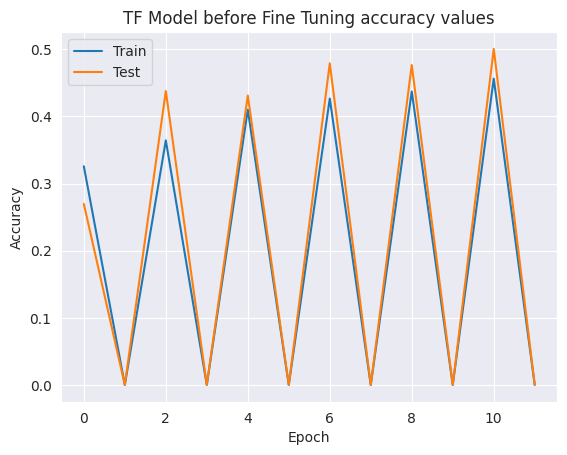

In [ ]:
_# Plot training & validation loss values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('TF Model before Fine Tuning accuracy values')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()


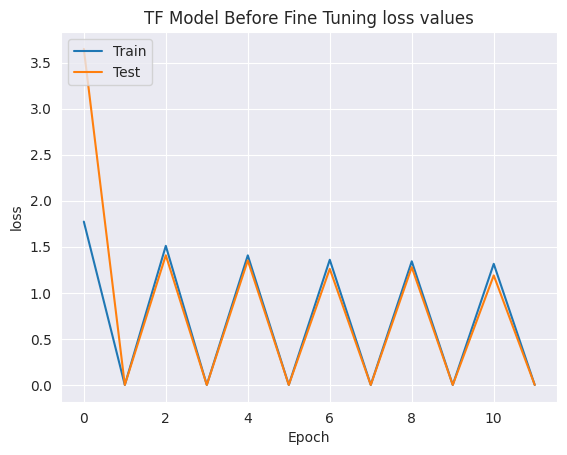

In [ ]:
_# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('TF Model Before Fine Tuning loss values')
plt.ylabel('loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

**3. Evaluate the Model:[2]**

* Pick appropriate evaluation metrics to evaluate your model.

In [ ]:
train_score = model1.evaluate(train_gen, verbose= 1)
valid_score = model1.evaluate(val_gen, verbose= 1)
test_score = model1.evaluate(test_gen, verbose= 1)

print("Train Loss: ", train_score[0])
print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

110/110 ━━━━━━━━━━━━━━━━━━━━ 47s 426ms/step - accuracy: 0.5066 - loss: 1.1567


W0000 00:00:1715315237.771802     117 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 104ms/step - accuracy: 0.4893 - loss: 1.1751
24/24 ━━━━━━━━━━━━━━━━━━━━ 4s 169ms/step - accuracy: 0.4220 - loss: 1.2800


W0000 00:00:1715315244.770097     117 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


Train Loss:  1.1814101934432983
Train Accuracy:  0.499571293592453
--------------------
Validation Loss:  1.1890368461608887
Validation Accuracy:  0.5006675720214844
--------------------
Test Loss:  1.2124788761138916
Test Accuracy:  0.4820239543914795


In [ ]:
preds = model1.predict(test_gen)
y_pred = np.argmax(preds, axis=1)



 3/24 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step  

W0000 00:00:1715315256.353505     117 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


24/24 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step


W0000 00:00:1715315259.385619     118 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


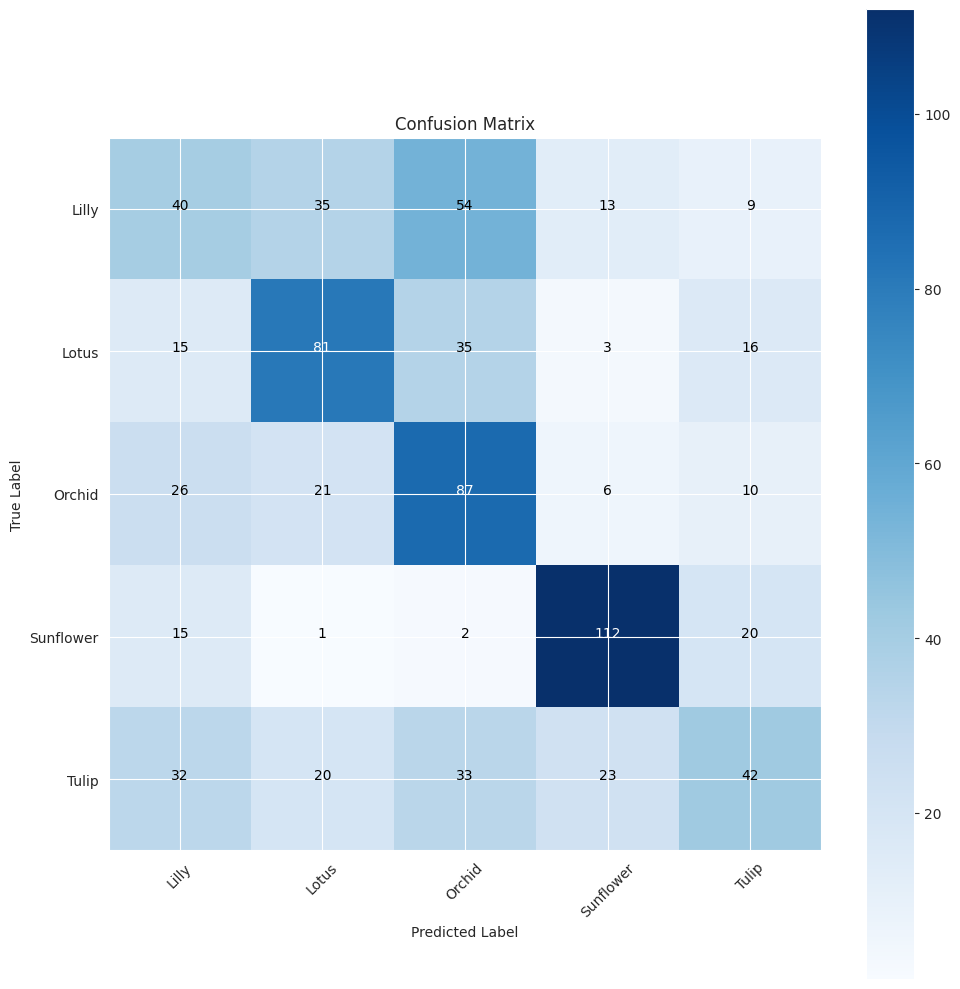

In [ ]:
g_dict = test_gen.class_indices
classes = list(g_dict.keys())
# Confusion matrix
cm = confusion_matrix(test_gen.classes, y_pred)
cm

plt.figure(figsize= (10, 10))
plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation= 45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment= 'center',
             color= 'white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()

In [ ]:
print(classification_report(test_gen.classes, y_pred,
                            target_names= classes))

              precision    recall  f1-score   support

       Lilly       0.31      0.26      0.29       151
       Lotus       0.51      0.54      0.53       150
      Orchid       0.41      0.58      0.48       150
   Sunflower       0.71      0.75      0.73       150
       Tulip       0.43      0.28      0.34       150

    accuracy                           0.48       751
   macro avg       0.48      0.48      0.47       751
weighted avg       0.48      0.48      0.47       751



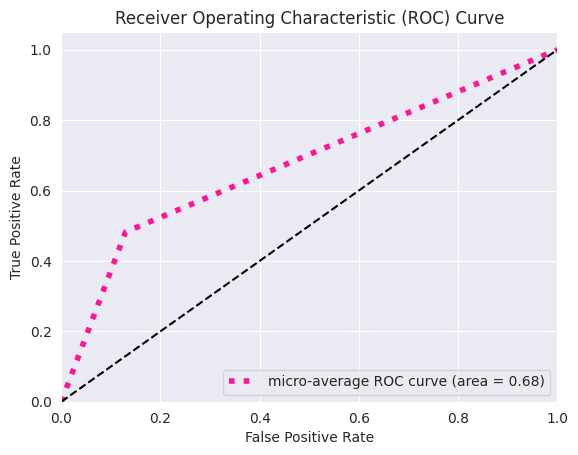

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Assuming you have predicted class indices for each sample
y_score = np.argmax(preds, axis=1)

# Assuming test_generator.classes contains true class labels of your test data
y_true = test_gen.classes

# Binarize the true labels
n_classes = len(np.unique(y_true))
y_true_binarized = label_binarize(y_true, classes=np.arange(n_classes))

# Binarize the predicted class indices
y_score_binarized = label_binarize(y_score, classes=np.arange(n_classes))

# Compute ROC curve and ROC area
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_binarized[:, i], y_score_binarized[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_true_binarized.ravel(), y_score_binarized.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot micro-average ROC curve
plt.figure()
plt.plot(fpr["micro"], tpr["micro"], label='micro-average ROC curve (area = {0:0.2f})'.format(roc_auc["micro"]), color='deeppink', linestyle=':', linewidth=4)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


* Interpret and compare the performance on Train Set and Test Set.

**4. Prediction:[2]**

In this step we expect you to make an inference on the unseen data {feel free to use test image as an example of unseen data}.

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 545ms/step


W0000 00:00:1715309045.966477     141 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


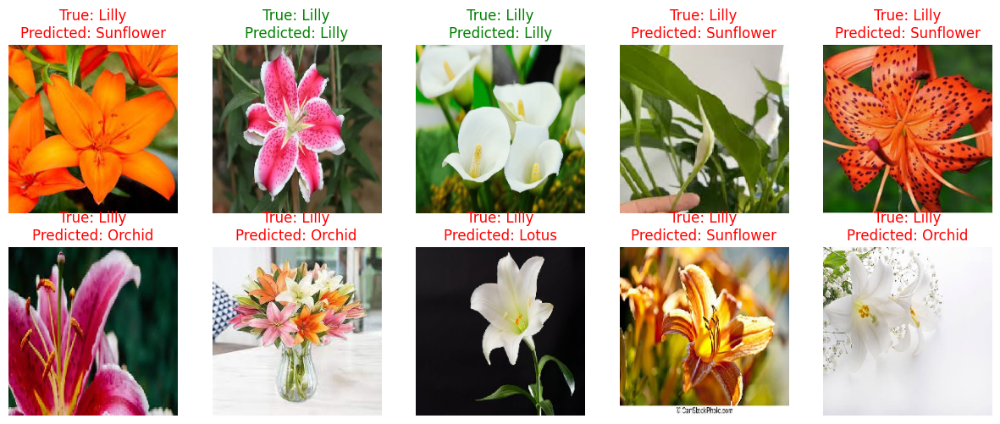

In [ ]:
import matplotlib.pyplot as plt


test_images, test_labels = next(test_gen)


predictions = model1.predict(test_images)
predicted_classes = np.argmax(predictions, axis=1)


class_labels = list(test_gen.class_indices.keys())


plt.figure(figsize=(15, 15))
num_plots = min(len(test_images), 10)
for i in range(num_plots):
    plt.subplot(5, 5, i + 1)
    plt.imshow(test_images[i])
    plt.axis('off')
    true_label = class_labels[np.argmax(test_labels[i])]
    predicted_label = class_labels[predicted_classes[i]]
    color = 'green' if true_label == predicted_label else 'red'
    plt.title(f'True: {true_label}\nPredicted: {predicted_label}', color=color)
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


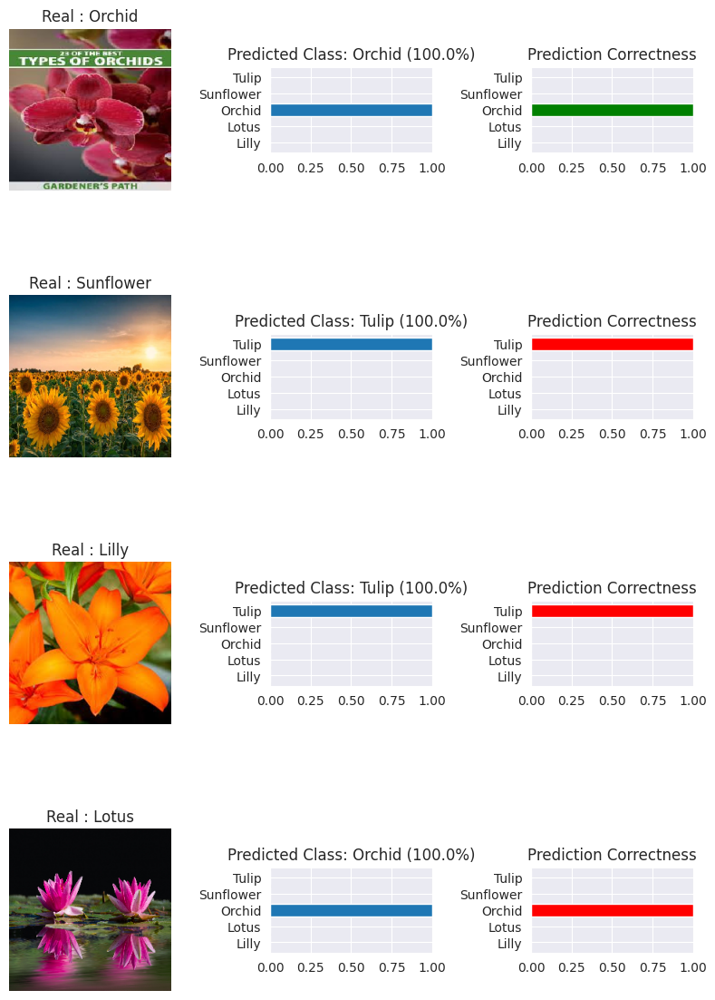

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import array_to_img


test_data = [(test_gen[i][0][0], test_gen[i][1][0]) for i in range(len(test_gen))]


class_names = ['Lilly', 'Lotus', 'Orchid', 'Sunflower', 'Tulip' ]

fig, ax = plt.subplots(figsize=(8, 12), ncols=3, nrows=4)

for row in range(4):
    i = np.random.randint(0, high=len(test_data))
    img, label = test_data[i]


    img = array_to_img(img)


    percent = model1.predict(np.expand_dims(img, axis=0))[0]
    pred_class_idx = np.argmax(percent)
    pred_class_name = class_names[pred_class_idx]


    true_class_idx = np.argmax(label)
    true_class_name = class_names[true_class_idx]


    ax[row][0].imshow(img)
    ax[row][0].set_title('Real : {}'.format(true_class_name))
    ax[row][0].axis('off')


    ax[row][1].barh(class_names, percent)
    ax[row][1].set_aspect(0.1)
    ax[row][1].set_title('Predicted Class: {} ({}%)'.format(pred_class_name, round(percent[pred_class_idx] * 100, 2)))
    ax[row][1].set_xlim(0, 1.)


    color = 'green' if pred_class_idx == true_class_idx else 'red'

    ax[row][2].barh(class_names, percent, color=color)
    ax[row][2].set_aspect(0.1)
    ax[row][2].set_title('Prediction Correctness')
    ax[row][2].set_xlim(0, 1.)

plt.tight_layout()
plt.show()


In [ ]:

predictions = model1.predict(test_gen)


predicted_classes = np.argmax(predictions, axis=1)


true_classes = test_gen.classes


class_labels = list(test_gen.class_indices.keys())


for i in range(len(true_classes)):
    print(f"True class: {class_labels[true_classes[i]]}, Predicted class: {class_labels[predicted_classes[i]]}")


24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 104ms/step
True class: Lilly, Predicted class: Sunflower
True class: Lilly, Predicted class: Orchid
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Orchid
True class: Lilly, Predicted class: Tulip
True class: Lilly, Predicted class: Sunflower
True class: Lilly, Predicted class: Lotus
True class: Lilly, Predicted class: Tulip
True class: Lilly, Predicted class: Sunflower
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Tulip
True class: Lilly, Predicted class: Tulip
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Lotus
True class: Lilly, Predicted class: Orchid
True class: Lilly, Predicted class: Tulip
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Tulip
True class: Lilly, Predicted class: Tulip
True class: Lilly, Predicted class: Tulip
True class: Lilly, Predicted class: Lilly
True class: Lilly, P

# **2.3 Task3: Building Convolutional Neural Network[12].**

In this section we expect you to perform following tasks:

**1. Model Building:[3]**

Based on the size of your input image, design and build FCNN. You can have as many layers you think is required for your task.

You should be able to explain your model summary.

In [ ]:
import numpy as np
import pandas as pd
import os
import itertools
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adamax
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten,Dense,Dropout, BatchNormalization

import warnings
warnings.filterwarnings("ignore")

print("Load Models")

Load Models


In [ ]:
channels = 3
image_size = (224, 224)
image_shape =(image_size[0], image_size[1], channels)

class_count = len(list(train_gen.class_indices.keys()))

model = Sequential([
    Conv2D(filters = 32 , kernel_size = (3,3) , padding='same', activation='relu', input_shape=image_shape),
    Conv2D(filters = 32 , kernel_size = (3,3) , padding='same', activation='relu'),
    Conv2D(filters = 32 , kernel_size = (3,3) , padding='same', activation='relu'),

    BatchNormalization(),
    MaxPooling2D((2, 2)),

    Conv2D(filters = 64 , kernel_size = (3,3) , padding='same', activation='relu'),
    Conv2D(filters = 64 , kernel_size = (3,3) , padding='same', activation='relu'),
    Conv2D(filters = 64 , kernel_size = (3,3) , padding='same', activation='relu'),

    BatchNormalization(),
    MaxPooling2D((2, 2)),

    Conv2D(filters = 128 , kernel_size = (3,3) , padding='same', activation='relu'),
    Conv2D(filters = 128 , kernel_size = (3,3) , padding='same', activation='relu'),
    Conv2D(filters = 128 , kernel_size = (3,3) , padding='same', activation='relu'),

    BatchNormalization(),
    MaxPooling2D((2, 2)),

    Conv2D(filters = 256 , kernel_size = (3,3) , padding='same', activation='relu'),
    Conv2D(filters = 256 , kernel_size = (3,3) , padding='same', activation='relu'),

    BatchNormalization(),
    MaxPooling2D((2, 2)),

    Flatten(),

    Dense(256, activation="relu"),
    Dense(128, activation="relu"),
    Dropout(rate=0.3, seed=123),
    Dense(class_count, activation="softmax")

])

model.compile(optimizer=Adamax(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

model.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_11 (Conv2D)              │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 224, 224, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 224, 224, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_18          │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 112, 112, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 112, 112, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_19          │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_18 (Conv2D)              │ (None, 56, 56, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, 56, 56, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_20          │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_20 (Conv2D)              │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_21 (Conv2D)              │ (None, 28, 28, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_21          │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_5 (Flatten)             │ (None, 50176)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 256)            │    12,845,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 128)            │             

 Total params: 14,246,789 (54.35 MB)

 Trainable params: 14,245,829 (54.34 MB)

 Non-trainable params: 960 (3.75 KB)

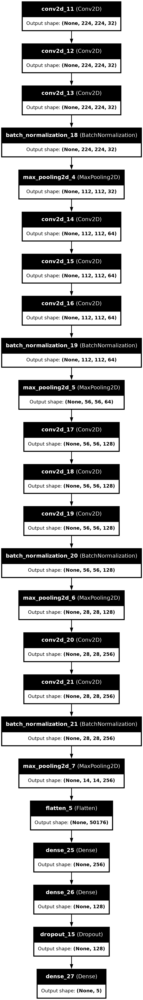

In [ ]:
import tensorflow as tf
from tensorflow import keras
tf.keras.utils.plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)

**2. Train the Model:[3]**

* Once the model is built, Train your model for as many epochs you think is necessary. cautions: Think about the computing complexity, we suggest you to utilize the GPU of the Google Colab.!!!

In [ ]:
import tensorflow as tf
from tensorflow import keras

In [ ]:
history1 = model.fit(train_gen, epochs= 30, verbose= 1,
                    validation_data = val_gen, shuffle= False)

Epoch 1/30


W0000 00:00:1715315430.157894     119 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 587ms/step - accuracy: 0.3423 - loss: 2.0337

W0000 00:00:1715315494.270577     117 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1715315495.785548     116 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


110/110 ━━━━━━━━━━━━━━━━━━━━ 112s 675ms/step - accuracy: 0.3429 - loss: 2.0296 - val_accuracy: 0.2003 - val_loss: 3.5064
Epoch 2/30


W0000 00:00:1715315503.994388     118 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


110/110 ━━━━━━━━━━━━━━━━━━━━ 50s 449ms/step - accuracy: 0.5100 - loss: 1.2033 - val_accuracy: 0.2003 - val_loss: 5.0693
Epoch 3/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 50s 452ms/step - accuracy: 0.5684 - loss: 1.0877 - val_accuracy: 0.2003 - val_loss: 5.3977
Epoch 4/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 51s 463ms/step - accuracy: 0.5934 - loss: 1.0206 - val_accuracy: 0.2844 - val_loss: 3.4443
Epoch 5/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 51s 463ms/step - accuracy: 0.6270 - loss: 0.9494 - val_accuracy: 0.4219 - val_loss: 1.5855
Epoch 6/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 50s 456ms/step - accuracy: 0.6452 - loss: 0.9239 - val_accuracy: 0.6449 - val_loss: 0.9155
Epoch 7/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 50s 451ms/step - accuracy: 0.6644 - loss: 0.8819 - val_accuracy: 0.6649 - val_loss: 0.8855
Epoch 8/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 50s 455ms/step - accuracy: 0.6890 - loss: 0.8203 - val_accuracy: 0.6916 - val_loss: 0.7954
Epoch 9/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 50s 456ms/step - accuracy: 0.6855 - loss: 0.8107 - val

In [ ]:
# Save the model to H5 file
model.save('model.h5')

* You can use any optimizer and loss function of your choice.

* Please, Plot and show training loss/validation loss behaviour for each iterations.

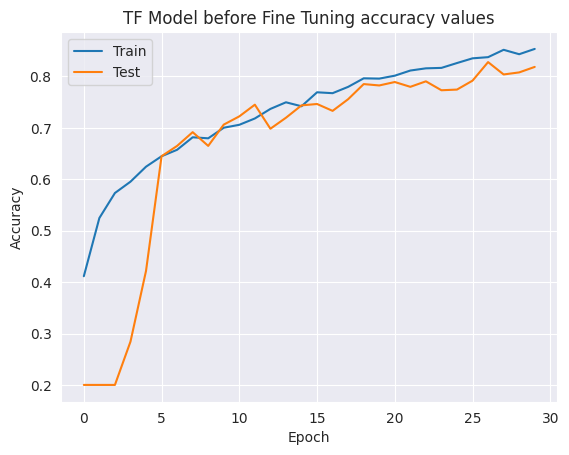

In [ ]:
_# Plot training & validation loss values
plt.plot(history1.history['accuracy'])
plt.plot(history1.history['val_accuracy'])
plt.title('TF Model before Fine Tuning accuracy values')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

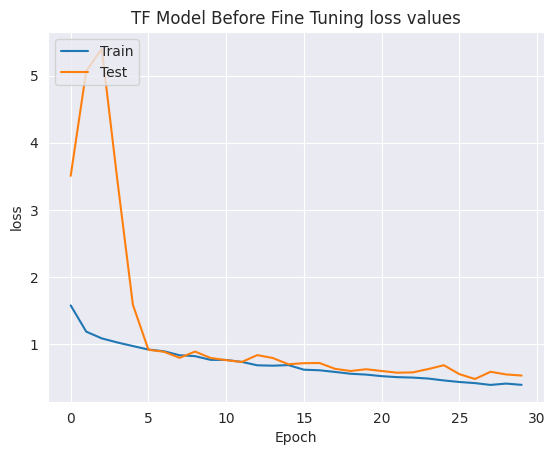

In [ ]:
_# Plot training & validation loss values
plt.plot(history1.history['loss'])
plt.plot(history1.history['val_loss'])
plt.title('TF Model Before Fine Tuning loss values')
plt.ylabel('loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

**3. Evaluate the Model:[3]**

* Pick appropriate evaluation metrics to evaluate your model.

* Interpret and compare the performance on Train Set and Test Set.

In [ ]:
train_score1 = model.evaluate(train_gen, verbose= 1)
valid_score1 = model.evaluate(val_gen, verbose= 1)
test_score1 = model.evaluate(test_gen, verbose= 1)

print("Train Loss: ", train_score1[0])
print("Train Accuracy: ", train_score1[1])
print('-' * 20)
print("Validation Loss: ", valid_score1[0])
print("Validation Accuracy: ", valid_score1[1])
print('-' * 20)
print("Test Loss: ", test_score1[0])
print("Test Accuracy: ", test_score1[1])



110/110 ━━━━━━━━━━━━━━━━━━━━ 48s 433ms/step - accuracy: 0.8956 - loss: 0.2852


W0000 00:00:1715317126.703307     119 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - accuracy: 0.8295 - loss: 0.5037
24/24 ━━━━━━━━━━━━━━━━━━━━ 9s 402ms/step - accuracy: 0.7832 - loss: 0.6638
Train Loss:  0.2915481626987457
Train Accuracy:  0.8965418934822083
--------------------
Validation Loss:  0.5311442017555237
Validation Accuracy:  0.8184245824813843
--------------------
Test Loss:  0.5346547961235046
Test Accuracy:  0.8242343664169312


W0000 00:00:1715317173.388872     118 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


In [ ]:
preds1 = model.predict(test_gen)
y_pred1 = np.argmax(preds1, axis=1)
print(y_pred1)

24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step
[0 1 0 0 4 0 0 0 4 0 0 4 0 0 0 2 4 0 0 0 0 0 0 0 0 1 0 3 0 0 0 2 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 4 1 0 3 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 2
 0 0 1 0 0 0 1 1 0 3 0 0 2 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 2 3 0 0 0 4 1 0
 0 0 0 3 4 0 0 3 0 2 0 0 0 1 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 2 0 0 0 1 0 0
 0 0 0 1 1 1 2 1 1 1 1 1 1 2 1 3 1 1 1 1 1 1 2 1 2 1 1 1 1 1 1 1 1 1 1 3 0
 2 0 1 1 2 1 1 1 1 2 1 4 1 2 0 1 1 1 1 2 1 3 1 1 3 0 2 1 1 1 1 1 1 4 1 2 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 2 1 0 1 1 1 0 1 1 1 1 1 0 1 1 1 1
 2 0 1 0 1 2 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1 1 2 1 1 1 1 2 1 1 1 1 1 2 1 1 0
 1 1 1 1 1 2 2 2 2 2 2 2 2 0 1 2 2 2 1 2 2 2 2 2 2 2 1 0 2 2 2 2 1 2 2 1 1
 0 2 2 2 2 0 2 2 2 2 2 2 2 2 2 2 2 3 2 2 2 2 2 2 0 3 2 2 2 2 2 3 2 2 0 2 2
 0 2 2 2 2 2 2 2 1 2 2 2 2 2 2 0 4 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 2 2 2 3 2
 3 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 0 2 2 0 2 2 2 3 2 2 2 2 2
 2 0 3 2 0 2 0 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 

In [ ]:
g_dict = test_gen.class_indices
classes = list(g_dict.keys())
print(classes)

['Lilly', 'Lotus', 'Orchid', 'Sunflower', 'Tulip']


In [ ]:
preds1 = model.predict(test_gen)
y_pred1 = np.argmax(preds1, axis=1)


label_to_class = {
    0: 'Lilly',
    1: 'Lotus',
    2: 'Orchid',
    3: 'Sunflower',
    4: 'Tulip'
}


predicted_classes = [label_to_class[label] for label in y_pred1]

print("Predicted classes:")
print(predicted_classes)


24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 105ms/step
Predicted classes:
['Lilly', 'Lotus', 'Lilly', 'Lilly', 'Tulip', 'Lilly', 'Lilly', 'Lilly', 'Tulip', 'Lilly', 'Lilly', 'Tulip', 'Lilly', 'Lilly', 'Lilly', 'Orchid', 'Tulip', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lotus', 'Lilly', 'Sunflower', 'Lilly', 'Lilly', 'Lilly', 'Orchid', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lotus', 'Lilly', 'Lotus', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Tulip', 'Lotus', 'Lilly', 'Sunflower', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Orchid', 'Lilly', 'Lilly', 'Lilly', 'Orchid', 'Lilly', 'Lilly', 'Lotus', 'Lilly', 'Lilly', 'Lilly', 'Lotus', 'Lotus', 'Lilly', 'Sunflower', 'Lilly', 'Lilly', 'Orchid', 'Lotus', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lotus', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lil

In [ ]:

class_indices = test_gen.class_indices


classes = list(class_indices.keys())

print("Classes of test_gen:")
print(classes)


Classes of test_gen:
['Lilly', 'Lotus', 'Orchid', 'Sunflower', 'Tulip']


In [ ]:

class_labels = test_gen.classes


indices_to_classes = {v: k for k, v in test_gen.class_indices.items()}


class_names = [indices_to_classes[label] for label in class_labels]

print("Class names in test_gen:")
print(class_names)


Class names in test_gen:
['Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'Lilly', 'L

In [ ]:
preds1 = model.predict(test_gen)
y_pred1 = np.argmax(preds1, axis=1)

24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 122ms/step


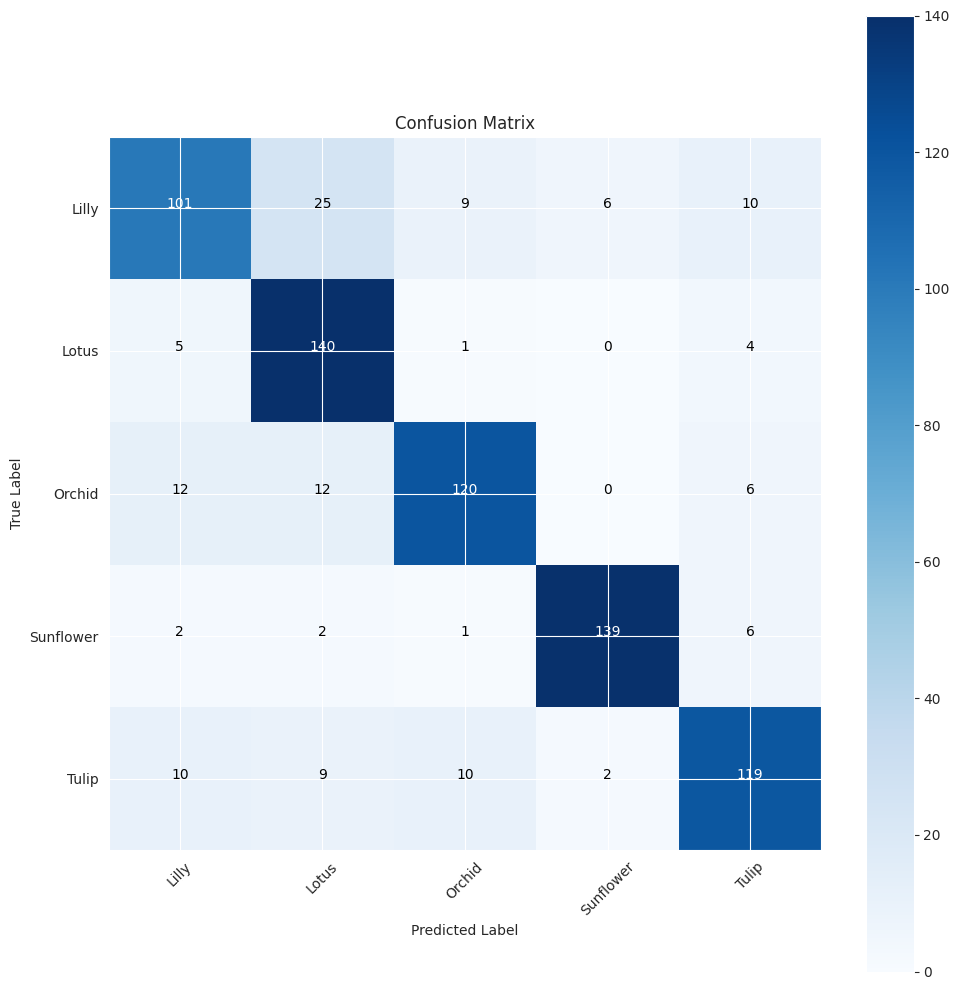

In [ ]:
g_dict = test_gen.class_indices
classes = list(g_dict.keys())

# Confusion matrix
cm = confusion_matrix(test_gen.classes, y_pred1)
cm

plt.figure(figsize= (10, 10))
plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation= 45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment= 'center',
             color= 'white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()

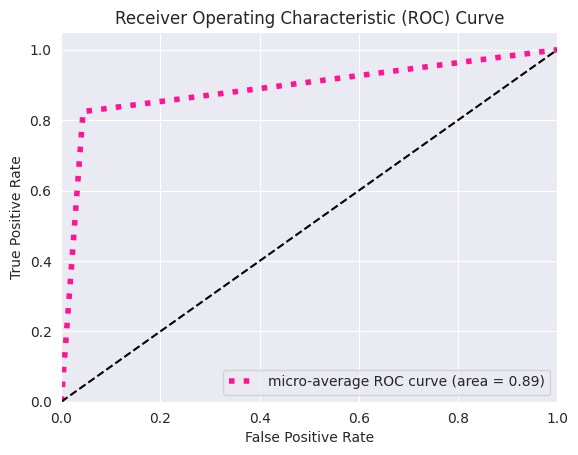

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Assuming you have predicted class indices for each sample
y_score1 = np.argmax(preds1, axis=1)

# Assuming test_generator.classes contains true class labels of your test data
y_true1 = test_gen.classes

# Binarize the true labels
n_classes = len(np.unique(y_true1))
y_true_binarized = label_binarize(y_true1, classes=np.arange(n_classes))

# Binarize the predicted class indices
y_score_binarized = label_binarize(y_score1, classes=np.arange(n_classes))

# Compute ROC curve and ROC area
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_binarized[:, i], y_score_binarized[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_true_binarized.ravel(), y_score_binarized.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot micro-average ROC curve
plt.figure()
plt.plot(fpr["micro"], tpr["micro"], label='micro-average ROC curve (area = {0:0.2f})'.format(roc_auc["micro"]), color='deeppink', linestyle=':', linewidth=4)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


In [ ]:
print(classification_report(test_gen.classes, y_pred1,
                            target_names= classes))

              precision    recall  f1-score   support

       Lilly       0.77      0.81      0.79       151
       Lotus       0.82      0.81      0.81       150
      Orchid       0.81      0.76      0.79       150
   Sunflower       0.91      0.99      0.95       150
       Tulip       0.84      0.79      0.82       150

    accuracy                           0.83       751
   macro avg       0.83      0.83      0.83       751
weighted avg       0.83      0.83      0.83       751



**4. Prediction [3]:**


In this step we expect you to make an inference on the unseen data.

In [ ]:
predictions = model.predict(test_gen)


predicted_classes = np.argmax(predictions, axis=1)


true_classes = test_gen.classes


class_labels = list(test_gen.class_indices.keys())


for i in range(len(true_classes)):
    print(f"True class: {class_labels[true_classes[i]]}, Predicted class: {class_labels[predicted_classes[i]]}")


24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Tulip
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Tulip
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Tulip
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Tulip
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Sunflower
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted cl

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


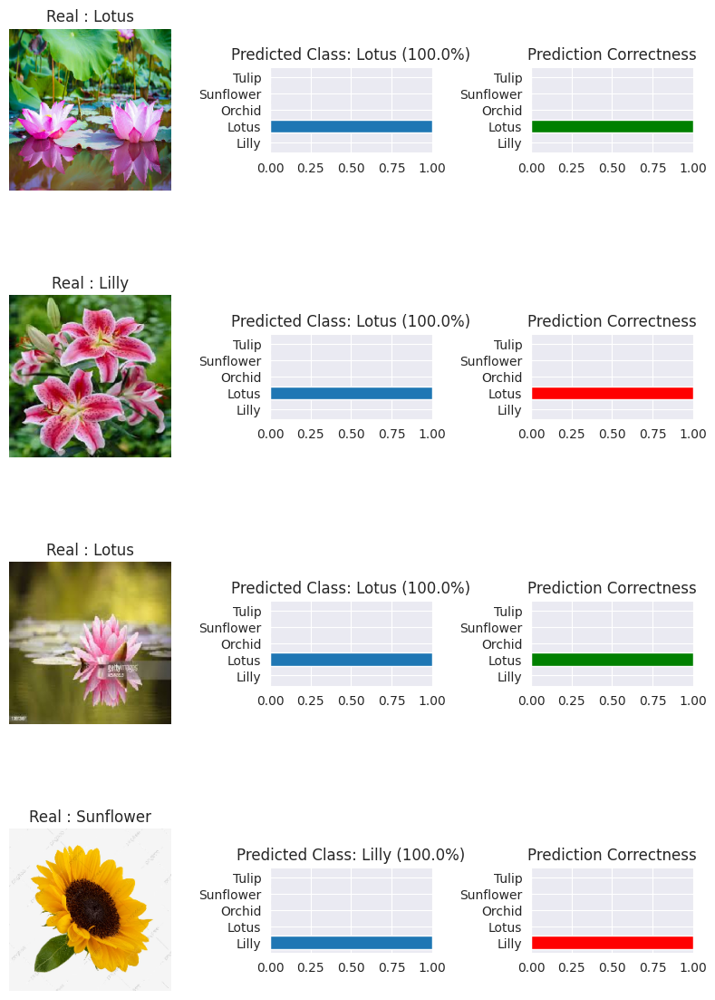

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import array_to_img


test_data = [(test_gen[i][0][0], test_gen[i][1][0]) for i in range(len(test_gen))]


class_names = ['Lilly', 'Lotus', 'Orchid', 'Sunflower', 'Tulip' ]

fig, ax = plt.subplots(figsize=(8, 12), ncols=3, nrows=4)

for row in range(4):
    i = np.random.randint(0, high=len(test_data))
    img, label = test_data[i]


    img = array_to_img(img)


    percent = model.predict(np.expand_dims(img, axis=0))[0]
    pred_class_idx = np.argmax(percent)
    pred_class_name = class_names[pred_class_idx]


    true_class_idx = np.argmax(label)
    true_class_name = class_names[true_class_idx]


    ax[row][0].imshow(img)
    ax[row][0].set_title('Real : {}'.format(true_class_name))
    ax[row][0].axis('off')


    ax[row][1].barh(class_names, percent)
    ax[row][1].set_aspect(0.1)
    ax[row][1].set_title('Predicted Class: {} ({}%)'.format(pred_class_name, round(percent[pred_class_idx] * 100, 2)))
    ax[row][1].set_xlim(0, 1.)


    color = 'green' if pred_class_idx == true_class_idx else 'red'

    ax[row][2].barh(class_names, percent, color=color)
    ax[row][2].set_aspect(0.1)
    ax[row][2].set_title('Prediction Correctness')
    ax[row][2].set_xlim(0, 1.)

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 719ms/step


W0000 00:00:1715311045.555089     141 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


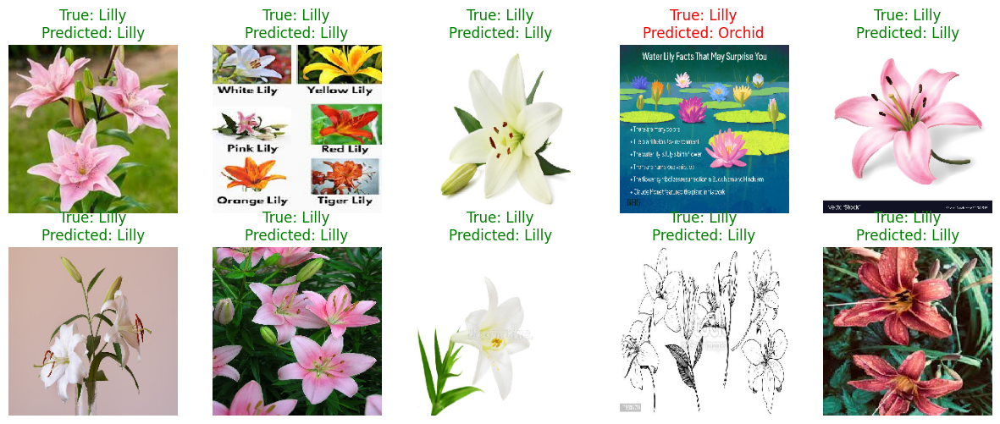

In [ ]:
import matplotlib.pyplot as plt


test_images, test_labels = next(test_gen)


predictions = model.predict(test_images)
predicted_classes = np.argmax(predictions, axis=1)


class_labels = list(test_gen.class_indices.keys())


plt.figure(figsize=(15, 15))
num_plots = min(len(test_images), 10)
for i in range(num_plots):
    plt.subplot(5, 5, i + 1)
    plt.imshow(test_images[i])
    plt.axis('off')
    true_label = class_labels[np.argmax(test_labels[i])]
    predicted_label = class_labels[predicted_classes[i]]
    color = 'green' if true_label == predicted_label else 'red'
    plt.title(f'True: {true_label}\nPredicted: {predicted_label}', color=color)
plt.show()

# **2.4 Task4: Transfer Learning.[12]**

In this step we expect you to fine tune a pre - trained model and evaluate the results.

**What is Transfer Learning?**

**In many real world deep learning applications, we utilize a pre-trained model weights achieved by training the models on a similar or related datasets. Many of these models can be loaded from KERAS (e.g. Inception, ResNet, VGG etc.), which are trained with IMAGENET datasets.**

**You can load a pre-trained model that suits your needs, modify its structure to fit your image classification task, and either freeze or fine-tune the model. Finally, you can use the trained model to perform image classification on the target dataset.**

In this section we expect you to perform following tasks:

**1. Select and Load a Pre - trained Model [3]**


Choose a pre-trained image classification model, such as VGG or ResNet.{Justify your selection.} Using a deep learning library, such as TensorFlow or Keras you can load the pre-trained model weights.

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import VGG16

In [ ]:

# Load pre-trained ResNet50 model without the top classification layer
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import VGG16


vgg_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))


for layer in vgg_model.layers:
    layer.trainable = False


vgg_model.summary()


Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 14,714,688 (56.13 MB)

**2. Restructure the model [3]**

With addition or removal of some layers to fit the requirements of your specific image classification task.

{Explain any change you made on the chosen model to meet the requirements.}

In [ ]:

from tensorflow.keras.layers import *
from tensorflow.keras.models import *


base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))


for layer in base_model.layers:
    layer.trainable = False


unique_labels = os.listdir(train_dir)
model2 = Sequential()
model2.add(Input(shape=(224, 224,3)))
model2.add(base_model)
model2.add(Flatten())
model2.add(Dropout(0.3))
model2.add(Dense(512, activation='relu'))
model2.add(Dropout(0.25))
model2.add(Dense(256, activation='relu'))
model2.add(Dropout(0.25))
model2.add(Dense(len(unique_labels), activation='softmax'))

model2.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 512)            │    12,845,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 5)              │         1,285 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 27,692,869 (105.64 MB)

 Trainable params: 12,978,181 (49.51 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

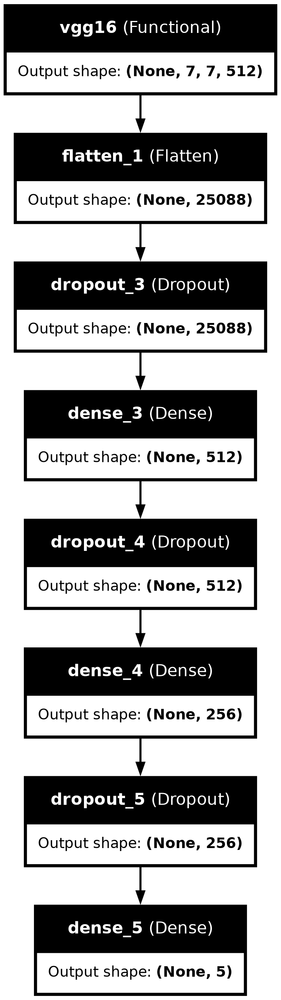

In [ ]:

tf.keras.utils.plot_model(model2, to_file='model.png', show_shapes=True, show_layer_names=True)

**3. Train the Model {Fine Tuning} [3]**

Freeze some or all of the layers in the model to prevent them from being modified during training, or fine-tune some of the layers to adapt the pre-trained weights to your specific task.

In [ ]:

model2.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
epochs=10

history_fine_tuned = model2.fit(
    train_gen,
    steps_per_epoch=train_gen.samples // train_gen.batch_size,
    epochs=epochs,
    validation_data=val_gen,
    validation_steps=val_gen.samples // val_gen.batch_size
)


Epoch 1/10
  1/109 ━━━━━━━━━━━━━━━━━━━━ 1:15:34 42s/step - accuracy: 0.2500 - loss: 1.8913

I0000 00:00:1715313748.689335     118 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1715313748.711963     118 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


 24/109 ━━━━━━━━━━━━━━━━━━━━ 1:42 1s/step - accuracy: 0.2542 - loss: 3.1086  

W0000 00:00:1715313776.447239     119 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 586ms/step - accuracy: 0.3953 - loss: 2.0565

W0000 00:00:1715313813.462601     117 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


109/109 ━━━━━━━━━━━━━━━━━━━━ 109s 625ms/step - accuracy: 0.3964 - loss: 2.0505 - val_accuracy: 0.7527 - val_loss: 0.7258
Epoch 2/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 15s 141ms/step - accuracy: 0.7500 - loss: 1.0196 - val_accuracy: 0.6923 - val_loss: 0.8128
Epoch 3/10


W0000 00:00:1715313831.689892     117 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


109/109 ━━━━━━━━━━━━━━━━━━━━ 53s 456ms/step - accuracy: 0.6961 - loss: 0.8339 - val_accuracy: 0.8043 - val_loss: 0.5756
Epoch 4/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 680us/step - accuracy: 0.7500 - loss: 0.7953 - val_accuracy: 0.9231 - val_loss: 0.3154
Epoch 5/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 53s 455ms/step - accuracy: 0.7268 - loss: 0.7401 - val_accuracy: 0.8247 - val_loss: 0.5254
Epoch 6/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 690us/step - accuracy: 0.7500 - loss: 0.7164 - val_accuracy: 1.0000 - val_loss: 0.1357
Epoch 7/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 52s 445ms/step - accuracy: 0.7844 - loss: 0.5971 - val_accuracy: 0.8166 - val_loss: 0.4926
Epoch 8/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 740us/step - accuracy: 0.8125 - loss: 0.5634 - val_accuracy: 0.9231 - val_loss: 0.6445
Epoch 9/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 52s 448ms/step - accuracy: 0.7984 - loss: 0.5592 - val_accuracy: 0.8383 - val_loss: 0.4636
Epoch 10/10
109/109 ━━━━━━━━━━━━━━━━━━━━ 0s 702us/step - accuracy: 0.7500 - loss: 0.7414 - val_ac

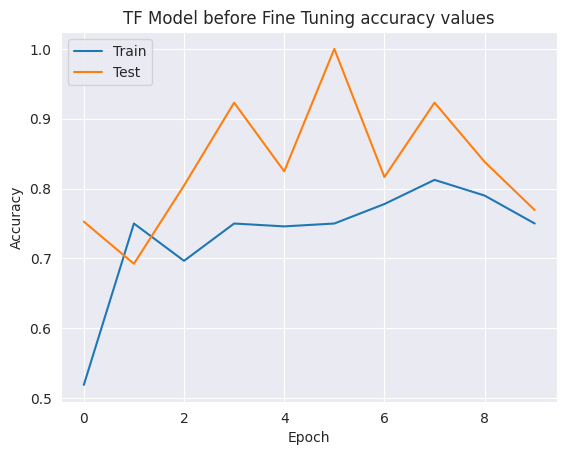

In [ ]:
_# Plot training & validation loss values
plt.plot(history_fine_tuned.history['accuracy'])
plt.plot(history_fine_tuned.history['val_accuracy'])
plt.title('TF Model before Fine Tuning accuracy values')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

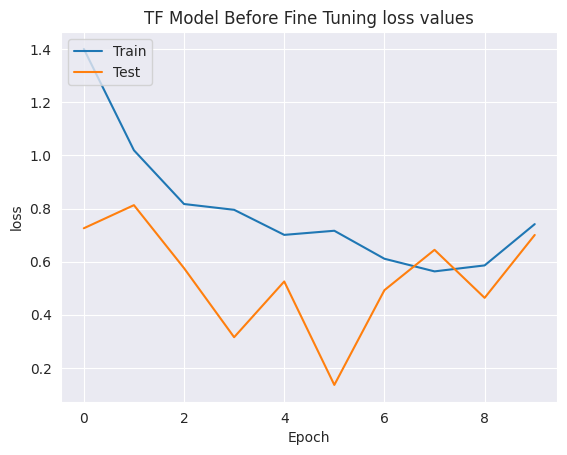

In [ ]:
_# Plot training & validation loss values
plt.plot(history_fine_tuned.history['loss'])
plt.plot(history_fine_tuned.history['val_loss'])
plt.title('TF Model Before Fine Tuning loss values')
plt.ylabel('loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

**4. Evaluate the model [3]**

Evaluate the Model Performance on some unseen test data also perform few inferences.

In [ ]:
train_score2 = model2.evaluate(train_gen, verbose= 1)
valid_score2 = model2.evaluate(val_gen, verbose= 1)
test_score2 = model2.evaluate(test_gen, verbose= 1)

print("Train Loss: ", train_score2[0])
print("Train Accuracy: ", train_score2[1])
print('-' * 20)
print("Validation Loss: ", valid_score2[0])
print("Validation Accuracy: ", valid_score2[1])
print('-' * 20)
print("Test Loss: ", test_score2[0])
print("Test Accuracy: ", test_score2[1])

110/110 ━━━━━━━━━━━━━━━━━━━━ 49s 448ms/step - accuracy: 0.8476 - loss: 0.4180


W0000 00:00:1715314155.830161     117 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - accuracy: 0.8437 - loss: 0.4652
24/24 ━━━━━━━━━━━━━━━━━━━━ 20s 857ms/step - accuracy: 0.8296 - loss: 0.4814
Train Loss:  0.40939095616340637
Train Accuracy:  0.8562446236610413
--------------------
Validation Loss:  0.4842801094055176
Validation Accuracy:  0.8344459533691406
--------------------
Test Loss:  0.42987364530563354
Test Accuracy:  0.8508654832839966


W0000 00:00:1715314179.542069     116 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


In [ ]:
preds2 = model2.predict(test_gen)
y_pred2 = np.argmax(preds2, axis=1)

 2/24 ━━━━━━━━━━━━━━━━━━━━ 3s 144ms/step 

W0000 00:00:1715314189.223052     119 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


24/24 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step


W0000 00:00:1715314192.822025     117 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


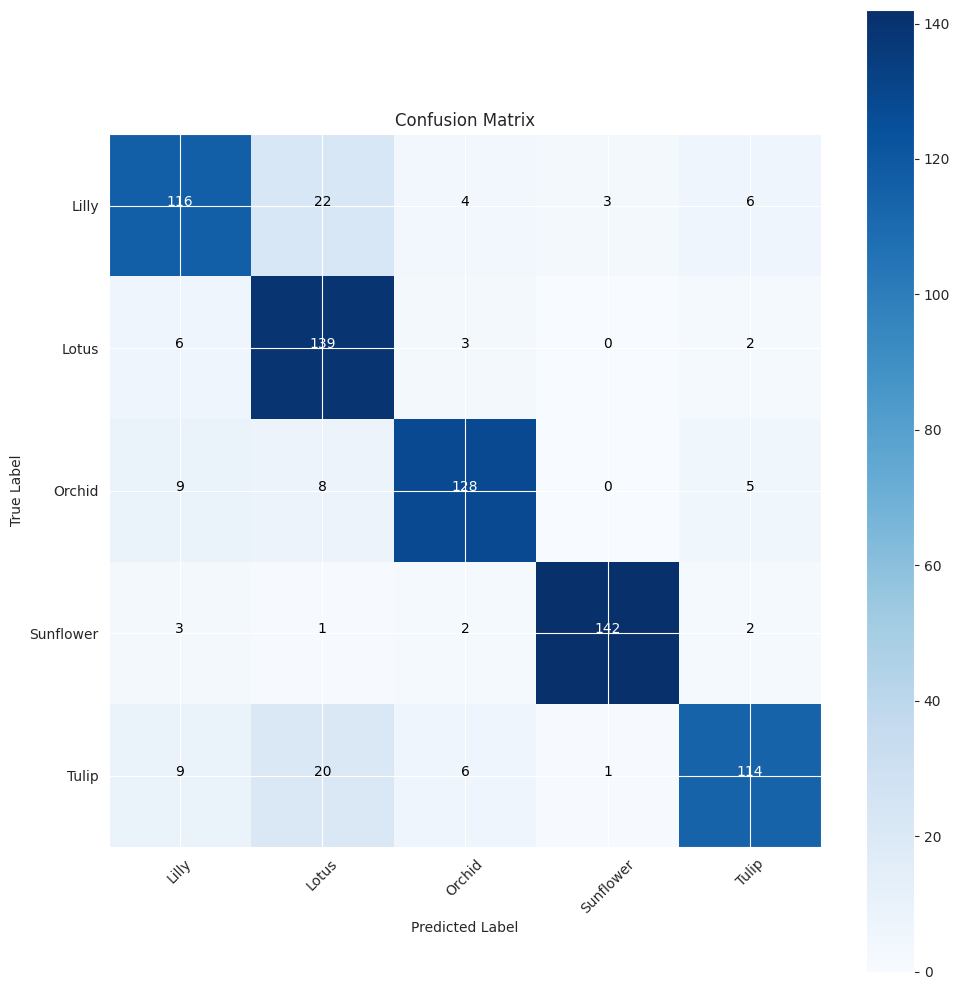

In [ ]:
g_dict = test_gen.class_indices
classes = list(g_dict.keys())
# Confusion matrix
cm = confusion_matrix(test_gen.classes, y_pred2)
cm

plt.figure(figsize= (10, 10))
plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation= 45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment= 'center',
             color= 'white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()

In [ ]:
print(classification_report(test_gen.classes, y_pred2,
                            target_names= classes))

              precision    recall  f1-score   support

       Lilly       0.81      0.77      0.79       151
       Lotus       0.73      0.93      0.82       150
      Orchid       0.90      0.85      0.87       150
   Sunflower       0.97      0.95      0.96       150
       Tulip       0.88      0.76      0.82       150

    accuracy                           0.85       751
   macro avg       0.86      0.85      0.85       751
weighted avg       0.86      0.85      0.85       751



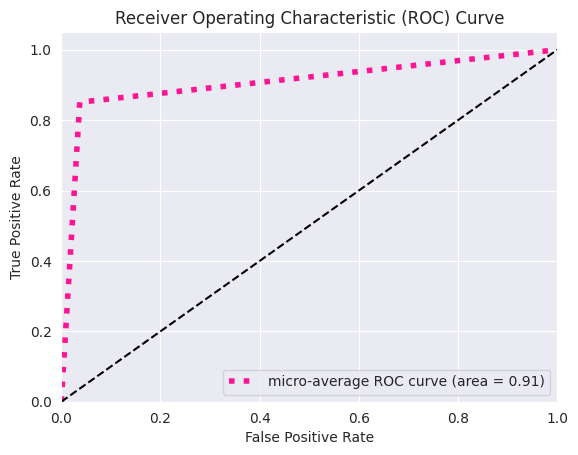

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Assuming you have predicted class indices for each sample
y_score2 = np.argmax(preds2, axis=1)

# Assuming test_generator.classes contains true class labels of your test data
y_true2 = test_gen.classes

# Binarize the true labels
n_classes = len(np.unique(y_true2))
y_true_binarized = label_binarize(y_true2, classes=np.arange(n_classes))

# Binarize the predicted class indices
y_score_binarized = label_binarize(y_score2, classes=np.arange(n_classes))

# Compute ROC curve and ROC area
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_binarized[:, i], y_score_binarized[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_true_binarized.ravel(), y_score_binarized.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot micro-average ROC curve
plt.figure()
plt.plot(fpr["micro"], tpr["micro"], label='micro-average ROC curve (area = {0:0.2f})'.format(roc_auc["micro"]), color='deeppink', linestyle=':', linewidth=4)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


In [ ]:

predictions2 = model2.predict(test_gen)


predicted_classes = np.argmax(predictions2, axis=1)


true_classes = test_gen.classes


class_labels = list(test_gen.class_indices.keys())


for i in range(len(true_classes)):
    print(f"True class: {class_labels[true_classes[i]]}, Predicted class: {class_labels[predicted_classes[i]]}")


24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 137ms/step
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Lotus
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Lotus
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Orchid
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class: Lilly
True class: Lilly, Predicted class

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


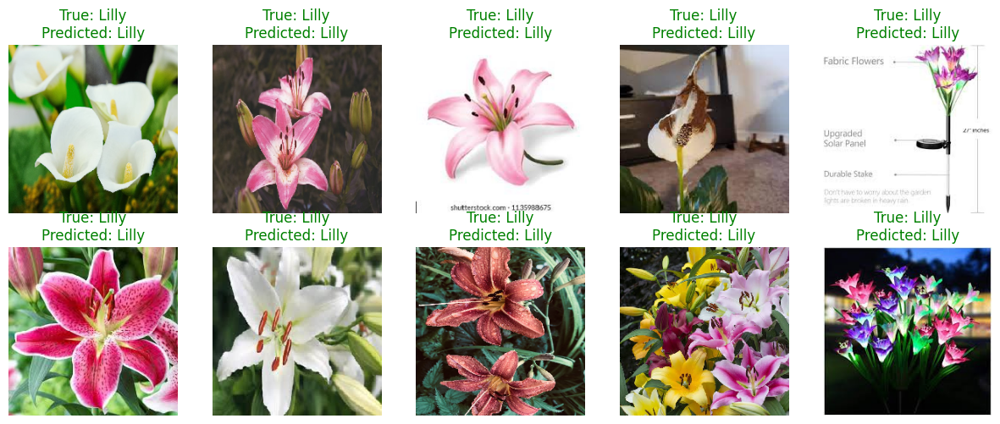

In [ ]:
import matplotlib.pyplot as plt


test_images, test_labels = next(test_gen)


predictions2 = model2.predict(test_images)
predicted_classes = np.argmax(predictions2, axis=1)


class_labels = list(test_gen.class_indices.keys())


plt.figure(figsize=(15, 15))
num_plots = min(len(test_images), 10)
for i in range(num_plots):
    plt.subplot(5, 5, i + 1)
    plt.imshow(test_images[i])
    plt.axis('off')
    true_label = class_labels[np.argmax(test_labels[i])]
    predicted_label = class_labels[predicted_classes[i]]
    color = 'green' if true_label == predicted_label else 'red'
    plt.title(f'True: {true_label}\nPredicted: {predicted_label}', color=color)
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


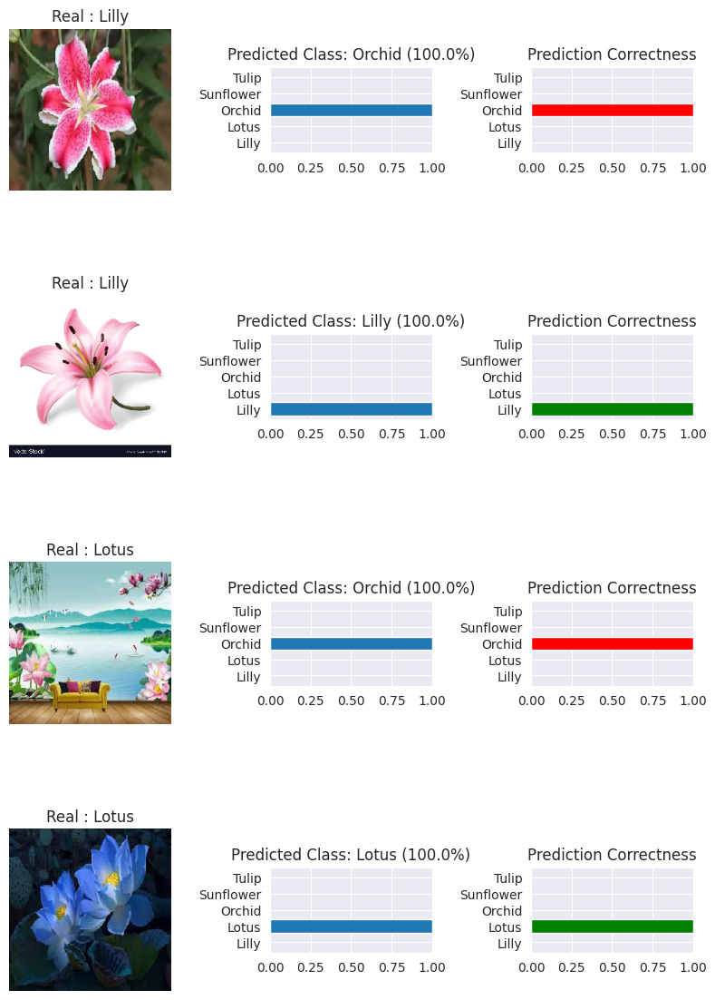

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import array_to_img


test_data = [(test_gen[i][0][0], test_gen[i][1][0]) for i in range(len(test_gen))]


class_names = ['Lilly', 'Lotus', 'Orchid', 'Sunflower', 'Tulip' ]

fig, ax = plt.subplots(figsize=(8, 12), ncols=3, nrows=4)

for row in range(4):
    i = np.random.randint(0, high=len(test_data))
    img, label = test_data[i]


    img = array_to_img(img)


    percent = model2.predict(np.expand_dims(img, axis=0))[0]
    pred_class_idx = np.argmax(percent)
    pred_class_name = class_names[pred_class_idx]


    true_class_idx = np.argmax(label)
    true_class_name = class_names[true_class_idx]


    ax[row][0].imshow(img)
    ax[row][0].set_title('Real : {}'.format(true_class_name))
    ax[row][0].axis('off')


    ax[row][1].barh(class_names, percent)
    ax[row][1].set_aspect(0.1)
    ax[row][1].set_title('Predicted Class: {} ({}%)'.format(pred_class_name, round(percent[pred_class_idx] * 100, 2)))
    ax[row][1].set_xlim(0, 1.)


    color = 'green' if pred_class_idx == true_class_idx else 'red'

    ax[row][2].barh(class_names, percent, color=color)
    ax[row][2].set_aspect(0.1)
    ax[row][2].set_title('Prediction Correctness')
    ax[row][2].set_xlim(0, 1.)

plt.tight_layout()
plt.show()

Cautions:!!!


The dimensions of the images in your data may not be the same as that in the ImageNet data. You may have re-size the images to required dimensions, required by each model using ”flow from directory” and ImageDataGenerator functions from tensorflow or Keras.

ImageNet has 1000 classes and hence the last layer of the pre-trained model would have 1000 nodes. However, your dataset may have a few number of classes, To address this issue you may have to rebuild and redesign the final dense or linear layer of your model.

Fine-tuning on a small training data may be very expensive, One common trick is to freeze all the layers except the last linear layers section of your model.

# **2.5 Task5: Final Discussion.[3]**



In this step we want you to perform comparative evaluation between:

* Image Classification with Fully Connected Neural Network.
* Image Classification with Convolutional Neural Network.
* Image Classification with Transfer learning and fine - tuning.

Which gave you the best result? and Why do you think that happen?

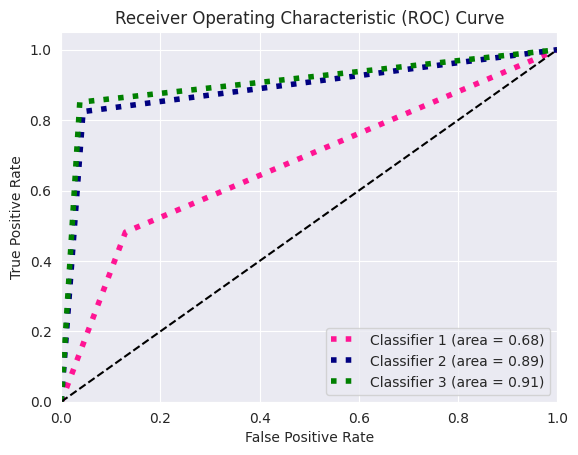

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Assuming you have predicted class indices for each sample
y_score1 = np.argmax(preds, axis=1)
y_score2 = np.argmax(preds1, axis=1)
y_score3 = np.argmax(preds2, axis=1)

# Assuming test_generator.classes contains true class labels of your test data
y_true = test_gen.classes

# Binarize the true labels
n_classes = len(np.unique(y_true))
y_true_binarized = label_binarize(y_true, classes=np.arange(n_classes))

# Binarize the predicted class indices
y_score_binarized1 = label_binarize(y_score1, classes=np.arange(n_classes))
y_score_binarized2 = label_binarize(y_score2, classes=np.arange(n_classes))
y_score_binarized3 = label_binarize(y_score3, classes=np.arange(n_classes))

# Compute ROC curve and ROC area for each classifier
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_binarized[:, i], y_score_binarized1[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area for each classifier
fpr["micro"], tpr["micro"], _ = roc_curve(y_true_binarized.ravel(), y_score_binarized1.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot micro-average ROC curve for the first classifier
plt.plot(fpr["micro"], tpr["micro"], label='Classifier 1 (area = {0:0.2f})'.format(roc_auc["micro"]), color='deeppink', linestyle=':', linewidth=4)

# Repeat the same process for the other classifiers
# Classifier 2
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_binarized[:, i], y_score_binarized2[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fpr["micro"], tpr["micro"], _ = roc_curve(y_true_binarized.ravel(), y_score_binarized2.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
plt.plot(fpr["micro"], tpr["micro"], label='Classifier 2 (area = {0:0.2f})'.format(roc_auc["micro"]), color='navy', linestyle=':', linewidth=4)

# Classifier 3
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_binarized[:, i], y_score_binarized3[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fpr["micro"], tpr["micro"], _ = roc_curve(y_true_binarized.ravel(), y_score_binarized3.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
plt.plot(fpr["micro"], tpr["micro"], label='Classifier 3 (area = {0:0.2f})'.format(roc_auc["micro"]), color='green', linestyle=':', linewidth=4)

# Plot the random guessing line
plt.plot([0, 1], [0, 1], 'k--')

# Set plot limits and labels
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()
